<a href="https://colab.research.google.com/github/d3ath-add3r/Shoes_Classification_Using_CNN/blob/main/NimishDalvi_DLExamPaper1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div align="center">
    <font face = "Garamond" size = "10" color = "Cyan"> Classification of Shoes Using CNN</font>
</div>
<div>
    <font face = "Arial" size = "4" color = "white">
    <br>
    &emsp;&emsp;&emsp; E-commerce has rapidly grown and their business strategies are completely based on user actions
and user experiences. Although it is completely based on users, we should also not forget to say
that there is a technology bridge in between users and growth in business. It may be Machine
Learning or Deep Learning. Companies apply many image classification techniques on data to
improve their catalog and give best suggestions to the users. They need accurate product
classification on their platforms for better user experience. But when you talk about products, there
exists a huge variety and classifying within varieties is really challenging. As a Deep Learning
engineer, you should always try cracking these kinds of challenges by classifying things within a
product itself.


# Goal:
        To train a model to classify data into different categories of shoes.

## About the dataset :
The dataset is all about of images of different categories of shoes. We have two sets in two folders : **Train** and **Test**
1.   Train : It consists of images belonging to three different categories of shoes in three folders namely Boots, Sandals and Slippers.
2.   Test : It consists of all category shoes images in one folder.

The dataset has been uploaded to a drive folder "DeepLearningExamPaper1" in compressed form "ShoeData.rar"
<br>
<a href = "https://drive.google.com/drive/folders/1uCcAlz4vUB65i60bKSOe7MERqEtLdOyn?usp=sharing"> Visit Drive Folder </a>


## Importing required packages and libraries :

In [ ]:
# We need to check  installed version of tensorflow, if not 2.0.0 we will have to correctly install it
# version 2.0.0 as it is a stable version
import tensorflow as tf
print(tf.__version__)

2.8.0


In [ ]:
# Installing correct version
!pip install tensorflow==2.0.0

In [ ]:
# Check again
import tensorflow as tf
print(tf.__version__)

2.0.0


In [ ]:
# Import all packages and libraries
# for data manipulation and processing
import pandas as pd
import numpy as np

# for visualisation
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array

from tensorflow.keras import backend as K

from imutils import paths
import random
import pickle
import cv2
import os
import time 

#To display progress bar
from tqdm import tqdm_notebook as tqdm
import itertools

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

SEED = 32 # Set random seed

## Load the data from drive

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Change the working directory to appropriate folder
os.chdir("/content/drive/MyDrive/DeepLearningExamPaper1") # Copied the folder path from files section on left side in Google Colab

In [ ]:
# Check current directory
!dir

NimishDalvi_DLExamPaper1.ipynb	ShoeData.rar


As seen, we have successfully changed the directory and it contained the compressed data folder. We need to unzip it.

## Unzipping the "ShoeData.rar"

In [ ]:
# Install required patool ibrary
!pip install patool

     |████████████████████████████████| 77 kB 3.3 MB/s 


In [ ]:
# Extracting ShoeData.rar only if it has not been done previously to avoid duplication
import patoolib
files = os.listdir() # Get all file names in the directory
a = 0
for name in files:
    if name=="ShoeData":
        print("Folder already extracted")
        a = 1
        break
    else:
        a = 0
if a==0:
    print("Extracting Data....")
    patoolib.extract_archive("ShoeData.rar")
    files = os.listdir()

print("Directory contains:")
!dir # Chech if extraction done

Extracting Data....
patool: Extracting ShoeData.rar ...
patool: running /usr/bin/unrar x -- /content/drive/MyDrive/DeepLearningExamPaper1/ShoeData.rar
patool:     with cwd='./Unpack_7xsrbx2m'
patool: ... ShoeData.rar extracted to `ShoeData'.
Directory contains:
NimishDalvi_DLExamPaper1.ipynb	ShoeData  ShoeData.rar


We can see ShoeData folder with extracted data is created.

In [ ]:
# Check contains of ShoeData
print("ShoeData folder contains : ", os.listdir('ShoeData'))
print("train folder contains : ", os.listdir('ShoeData/train'))

ShoeData folder contains :  ['test', 'train']
train folder contains :  ['Boots', 'Sandals', 'Slippers']


In [ ]:
# Initialising the data and labels

print("[WIP] Loading Images...")
time1 = time.time() # Start Time

# Enpty containers to store image data and labels
data = [] 
labels = []

# Classes / Categories
classes = ["Boots", "Sandals", "Slippers"]
classes_dict = {"Boots":0, "Sandals":1, "Slippers":2} # To map the  labels for label encoding

# Grab Image Paths and shuffle them to change order for random distribution

imgPaths = sorted(list(paths.list_images('ShoeData/train'))) # All training images 
random.seed(SEED)
random.shuffle(imgPaths)

# Progress to show the loading progress

with tqdm(total = len(imgPaths)) as pbar:

    # Loop over all training images to process them and get labels
    for imgPath in imgPaths:
        # Load the image using cv2
        try:
            img = cv2.imread(imgPath)
        # Resize the image to 64 x 64 X 3 = 12,288 
            img = cv2.resize(img, (64,64))
        
        except:
            continue # If any corrupt file is handled, it is skipped

        img = img_to_array(img)
        data.append(img)

        # extract labels
        label = imgPath.split(os.path.sep)[-2]
        label = classes_dict[label]
        labels.append(label)

        # Update the progress bar
        pbar.update(1)

# Scale the image pixels from range 0-255 to range 0-1(Normalize) for faster computation
data = np.array(data, dtype="float")/255.0
labels = np.array(labels) # Converts labels list to an array

print("Time taken to initialize : {:.1f} seconds".format(time.time()-time1)) # To measure time elapsed
print("Done")

[WIP] Loading Images...


  0%|          | 0/778 [00:00<?, ?it/s]

Time taken to initialize : 4.0 seconds
Done


In [ ]:
labels

array([1, 1, 1, 0, 0, 1, 1, 2, 1, 2, 0, 2, 1, 1, 1, 2, 1, 0, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 0, 2, 1, 1, 0, 0, 1, 0, 1, 1, 1, 2, 1, 0, 0,
       0, 0, 2, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 2, 2, 0, 1, 0, 1, 0,
       0, 2, 2, 2, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 2, 2, 0, 0, 2,
       0, 1, 1, 1, 1, 1, 2, 0, 1, 1, 1, 0, 0, 0, 2, 1, 2, 1, 1, 0, 1, 2,
       2, 0, 0, 1, 0, 0, 1, 1, 0, 1, 2, 2, 1, 2, 2, 2, 2, 1, 0, 1, 1, 2,
       1, 1, 1, 1, 1, 1, 2, 0, 1, 0, 0, 1, 2, 1, 2, 0, 1, 1, 0, 0, 0, 1,
       2, 2, 1, 0, 0, 1, 1, 2, 2, 0, 2, 0, 0, 1, 1, 2, 0, 2, 2, 0, 0, 1,
       1, 2, 2, 0, 1, 2, 0, 0, 2, 1, 2, 2, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 2, 0, 0, 0, 2, 1, 1,
       0, 0, 1, 0, 1, 2, 2, 1, 1, 1, 0, 0, 2, 2, 1, 0, 1, 1, 2, 1, 2, 1,
       0, 1, 0, 1, 0, 2, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 2, 1, 0,
       1, 1, 1, 2, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 0, 0, 2, 1, 2, 1, 2, 2, 1, 0, 1, 1, 0, 2,

In [ ]:
print("Total number of images : ", len(data))

Total number of images :  778


### Visualisation

In [ ]:
data[3].shape

(64, 64, 3)

In [ ]:
len(data[3])

64

In [ ]:
# We will print a sample image data, pixel values and its label class

# Fourth image
print("Fourth image data : {}".format(data[3]))
print("No of pixel values : {}".format(data[3].shape[0]*data[3].shape[1]*data[3].shape[2]))
print("Category : {} , Label : {}".format(classes[labels[3]], labels[3]))

Fourth image data : [[[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 ...

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]]
No of pixel values : 12288
Category : Boots , Label : 0


The image is of :  Boots


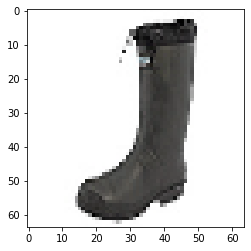

In [ ]:
# Display the forth image
fourth_img = (data[3]*255).astype("int") # Rescaling pixel values to original value
plt.imshow(fourth_img)
print("The image is of : ", classes[labels[3]])

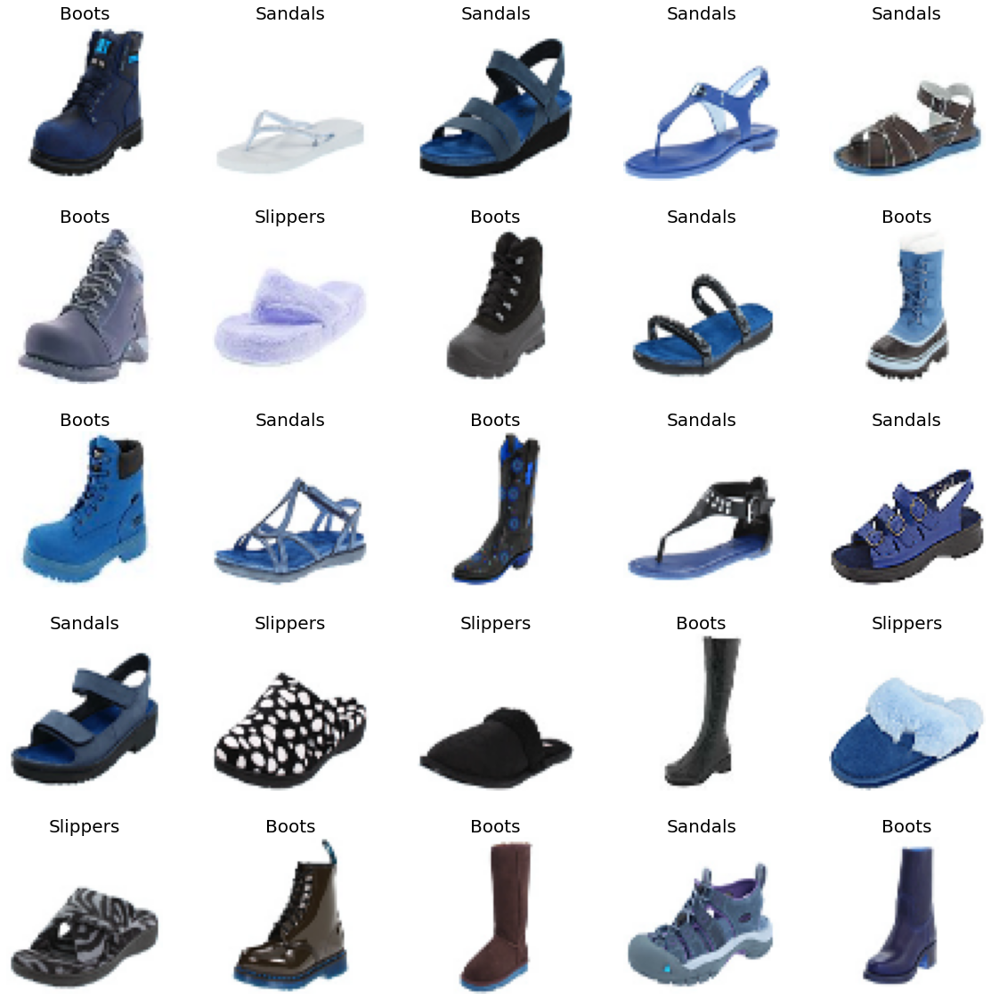

In [ ]:
# Now we will display grip of multiple images of all categories

# Set Grid Dimensions
w_grid = 5 # Horizontal
h_grid = 5 # vertical

fig, axes = plt.subplots(w_grid, h_grid, figsize = (20,20))

axes = axes.ravel() # Flatten the 2D Grid into array

n_data = len(data) # get total number of images

# Select a random number from 0 to n_data
for i in np.arange(0, w_grid*h_grid): #  Create evenly spaced variables
    # Select random number
    index = np.random.randint(0, n_data)
    
    # Display the image corresponding to random number
    axes[i].imshow(data[index])
    axes[i].set_title(classes[labels[index]], fontsize = 20)
    axes[i].axis('off')

plt.subplots_adjust(hspace=0.3)

### Splitting the data and labels into training and validation datasets

In [ ]:
# Split the data and lables into 80% train and 20% validation 
(trainX, valX, trainY, valY) = train_test_split(data, labels, test_size = 0.2, random_state = SEED)

In [ ]:
print("trainX shape is : ", trainX.shape)
print("trainY shape is : ", trainY.shape)

trainX shape is :  (622, 64, 64, 3)
trainY shape is :  (622,)


## **Define the CNN Architecture**

### Function to build CNN Model

In [ ]:
def build_cnn(height, width, depth, classes):
    #Initialize model
    model = Sequential()
    inputshape = (height, width, depth) # (64(h), 64(w), 3(channel))

    # If we are using "channel" first update input shape
    if K.image_data_format()=="channels_first":
        inputshape = (depth, height, width)

    # First pack of Convolutional layers Conv-RelU-Pool
    model.add(Conv2D(32, (3,3), padding = "same", input_shape = inputshape)) 
    model.add(Activation("relu"))
    model.add(MaxPooling2D(pool_size=(2,2), strides = (2,2)))

    # Second Pack of Convolutional Layer
    model.add(Conv2D(64, (3,3), padding = "same"))
    model.add(Activation("relu"))
    model.add(MaxPooling2D(pool_size=(2,2), strides = (2,2)))

    # First Set of Faltten, Dense and RelU
    model.add(Flatten())  # To make it ready for input to dense layer
    model.add(Dense(100))
    model.add(Activation("relu"))

    # Classifier layer 
    model.add(Dense(classes))  # Output layer with neurons equal to classes
    model.add(Activation("softmax"))  # As it multi-class classification

    # Return built model
    return model

In [ ]:
EPOCHS = 15 # Epochs, number of training cycles
INIT_LR = 1e-3 # Initial learning rate = 0.001
BS = 16 # Batch size

In [ ]:
# Compile the model

print("[WIP] Compiling the model....")
model_cnn = build_cnn(height = 64, width = 64, depth = 3, classes = 3)
opt = Adam(lr = INIT_LR, decay = INIT_LR / EPOCHS)
model_cnn.compile(loss="sparse_categorical_crossentropy", optimizer = opt, metrics = ["accuracy"]) # sparse_categorical_entropy is used when labels are label encoded and not one_hot_encoded
print("Model Compiled")

[WIP] Compiling the model....
Model Compiled


In [ ]:
model_cnn.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 64, 64, 32)        896       
_________________________________________________________________
activation_4 (Activation)    (None, 64, 64, 32)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 64)        18496     
_________________________________________________________________
activation_5 (Activation)    (None, 32, 32, 64)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 16384)            

We can see huge number of trainable parameters. Lets see how the model performs.

In [ ]:
# Train the network
print("[WIP] Training Model...")
h = model_cnn.fit(trainX, trainY, validation_data=(valX, valY), batch_size=BS, epochs=EPOCHS)

[WIP] Training Model...
Train on 622 samples, validate on 156 samples
Epoch 1/15
622/622 [==============================] - 6s 9ms/sample - loss: 0.8595 - accuracy: 0.6238 - val_loss: 0.4028 - val_accuracy: 0.8590
Epoch 2/15
622/622 [==============================] - 5s 8ms/sample - loss: 0.3000 - accuracy: 0.8891 - val_loss: 0.2367 - val_accuracy: 0.9167
Epoch 3/15
622/622 [==============================] - 5s 8ms/sample - loss: 0.2219 - accuracy: 0.9196 - val_loss: 0.2997 - val_accuracy: 0.8782
Epoch 4/15
622/622 [==============================] - 5s 8ms/sample - loss: 0.1894 - accuracy: 0.9132 - val_loss: 0.2258 - val_accuracy: 0.9038
Epoch 5/15
622/622 [==============================] - 5s 8ms/sample - loss: 0.1235 - accuracy: 0.9550 - val_loss: 0.1677 - val_accuracy: 0.9295
Epoch 6/15
622/622 [==============================] - 6s 9ms/sample - loss: 0.0995 - accuracy: 0.9582 - val_loss: 0.1271 - val_accuracy: 0.9487
Epoch 7/15
622/622 [==============================] - 5s 8ms/sampl

### CNN Model with Callback :

In [ ]:
# Setting up checkpoint
from tensorflow.keras.callbacks import ModelCheckpoint

filepath = 'my_best_model.hdf5' # Filename for best model

checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss',verbose = 1, save_best_only = True, mode = 'min')



In [ ]:
# Creating another callback for accuracy
from tensorflow.keras.callbacks import Callback
acc_threshold = 0.95

In [ ]:
# Call back function to stop training
class myCallback(Callback): 
    def on_epoch_end(self, epoch, logs={}): 
        if(logs.get('accuracy') > acc_threshold):   
            print("\nReached %2.2f%% accuracy, so stopping training!!" %(acc_threshold*100))   
            self.model.stop_training = True

In [ ]:

# Create Callbacks
callbacks_acc = myCallback()

callbacks=[checkpoint, callbacks_acc]

In [ ]:
# Building same CNN model again for new training and compiling

# Compile the model

print("[WIP] Compiling the model....")
model_cnn_cb = build_cnn(height = 64, width = 64, depth = 3, classes = 3)
opt = Adam(lr = INIT_LR, decay = INIT_LR / EPOCHS)
model_cnn_cb.compile(loss="sparse_categorical_crossentropy", optimizer = opt, metrics = ["accuracy"]) # sparse_categorical_entropy is used when labels are label encoded and not one_hot_encoded
print("Model Compiled")

[WIP] Compiling the model....
Model Compiled


In [ ]:
# Train the network
print("[WIP] Training Model with callback...")
h_cb = model_cnn_cb.fit(trainX, trainY, validation_data=(valX, valY), batch_size=BS, epochs=EPOCHS, callbacks=callbacks)

[WIP] Training Model with callback...
Train on 622 samples, validate on 156 samples
Epoch 1/15
608/622 [============================>.] - ETA: 0s - loss: 0.9248 - accuracy: 0.6184
Epoch 00001: val_loss improved from inf to 0.49908, saving model to my_best_model.hdf5
622/622 [==============================] - 6s 10ms/sample - loss: 0.9110 - accuracy: 0.6270 - val_loss: 0.4991 - val_accuracy: 0.7885
Epoch 2/15
608/622 [============================>.] - ETA: 0s - loss: 0.3335 - accuracy: 0.8651
Epoch 00002: val_loss improved from 0.49908 to 0.34037, saving model to my_best_model.hdf5
622/622 [==============================] - 5s 8ms/sample - loss: 0.3285 - accuracy: 0.8666 - val_loss: 0.3404 - val_accuracy: 0.7949
Epoch 3/15
608/622 [============================>.] - ETA: 0s - loss: 0.2107 - accuracy: 0.9194
Epoch 00003: val_loss did not improve from 0.34037
622/622 [==============================] - 5s 8ms/sample - loss: 0.2091 - accuracy: 0.9212 - val_loss: 0.3503 - val_accuracy: 0.8782

## Evaluate the models:
We will compare both the models.

**Validation Accuracy :**

In [ ]:
evaluation_cnn = model_cnn.evaluate(valX,valY)
print('TEST ACCURACY CNN Model: {:.3f}'.format(evaluation_cnn[1]))

156/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [ ]:
evaluation_cnn_cb = model_cnn_cb.evaluate(valX,valY)
print('TEST ACCURACY CNN Model with Callbacks: {:.3f}'.format(evaluation_cnn_cb[1]))

156/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

We can see that CNN model without callbacks provides better accuracy score than with callback as it is trained for less epochs

**Predictions :**

In [ ]:
print("Prediction probabilities of CNN Model without callback")
pred_prob_cnn = model_cnn.predict(valX)
print(pred_prob_cnn[0]) # These are the predicted classes

print("\nPrediction probabilities of CNN Model with callback")
pred_prob_cnn_cb = model_cnn_cb.predict(valX)
print(pred_prob_cnn_cb[0]) # These are the predicted classes

#Only first image predictions

Prediction probabilities of CNN Model without callback
[3.3722851e-09 9.9250937e-01 7.4906172e-03]

Prediction probabilities of CNN Model with callback
[0.00091627 0.6733287  0.325755  ]


In [ ]:
# We will get highest probability classes from corrresponding index.
print("Classes Predictions of CNN Model without callback")
predY_cnn = [np.argmax(i) for i in pred_prob_cnn] 
print(predY_cnn)  # Classes of prediction

print("\nClasses Predictions of CNN Model with callback")
predY_cnn_cb = [np.argmax(i) for i in pred_prob_cnn_cb] 
print(predY_cnn_cb)  # Classes of prediction

# All val images prediction

Classes Predictions of CNN Model without callback
[1, 1, 0, 1, 0, 0, 0, 1, 2, 1, 1, 2, 2, 2, 0, 0, 1, 0, 0, 2, 1, 0, 2, 1, 1, 0, 2, 2, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 2, 2, 0, 1, 1, 2, 0, 2, 1, 0, 0, 1, 2, 2, 1, 0, 1, 0, 2, 0, 2, 2, 0, 2, 1, 0, 1, 0, 0, 2, 2, 0, 2, 0, 1, 0, 2, 1, 2, 0, 2, 0, 2, 1, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 1, 0, 1, 0, 1, 1, 1, 0, 2, 0, 0, 1, 2, 0, 1, 1, 0, 0, 2, 0, 1, 0, 1, 1, 1, 0, 2, 2, 0, 0, 1, 1, 0, 0, 0, 0, 2, 1, 1]

Classes Predictions of CNN Model with callback
[1, 1, 0, 1, 0, 0, 0, 1, 2, 1, 1, 2, 1, 1, 0, 0, 1, 0, 0, 2, 1, 0, 2, 1, 1, 0, 2, 2, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 2, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 2, 2, 0, 2, 1, 1, 0, 2, 1, 0, 0, 1, 2, 2, 1, 0, 2, 0, 2, 0, 2, 2, 0, 2, 1, 0, 1, 0, 0, 2, 2, 0, 2, 0, 1, 0, 2, 1, 2, 0, 2, 0, 2, 1, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 1, 1, 1, 0, 1, 0, 0, 1, 2, 0, 1, 1, 0, 0, 2, 0, 1, 0, 1, 1, 1, 0, 2, 

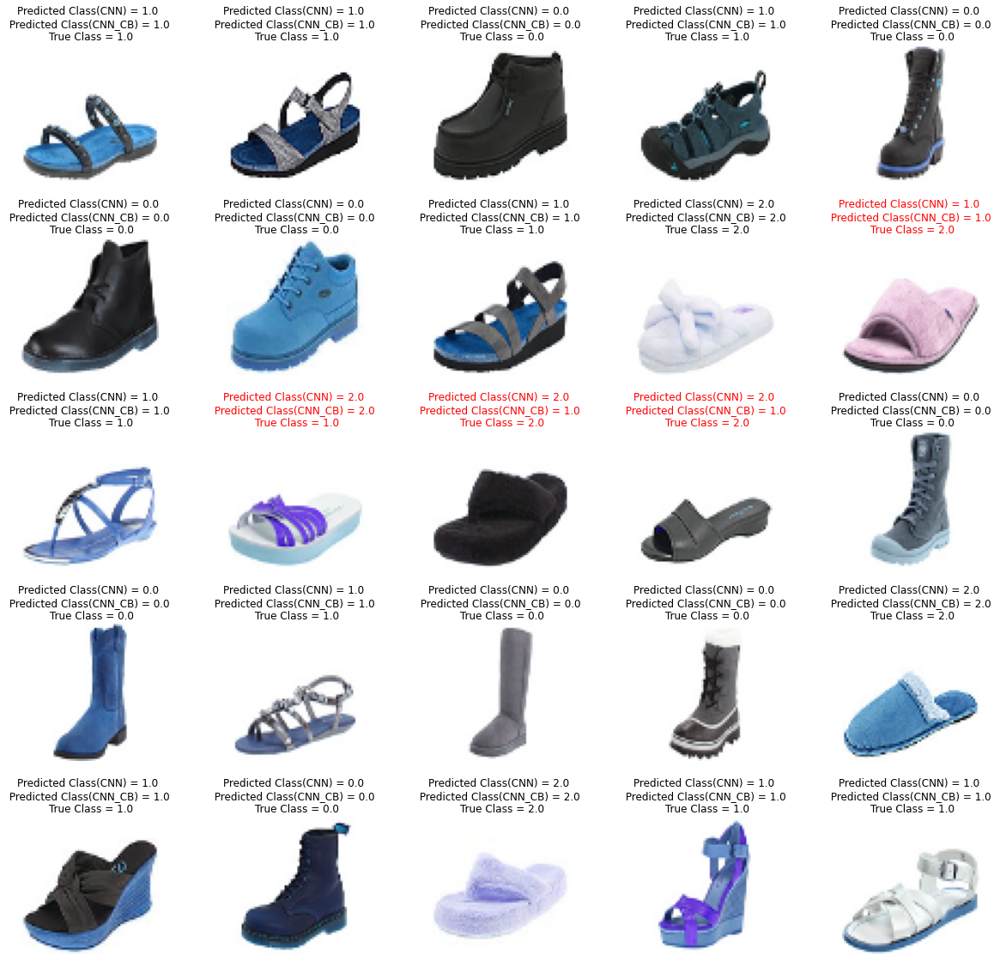

In [ ]:
# We will create a grid of images with their true label and predicted label.
l=5
w=5

fig, axes = plt.subplots(l, w, figsize=(20,20))
axes = axes.ravel()

for i in np.arange(0, l*w) :
    axes[i].imshow(valX[i])
    if valY[i]==predY_cnn[i] and valY[i]==predY_cnn_cb[i]:
        axes[i].set_title('Predicted Class(CNN) = {:.1f} \n Predicted Class(CNN_CB) = {:.1f} \n True Class = {:.1f}'.format(predY_cnn[i], predY_cnn_cb[i], valY[i]))
    else :
        axes[i].set_title('Predicted Class(CNN) = {:.1f} \n Predicted Class(CNN_CB) = {:.1f} \n True Class = {:.1f}'.format(predY_cnn[i], predY_cnn_cb[i], valY[i]), color="red")
    axes[i].axis('off')

plt.subplots_adjust(wspace=0.5)

From this sample images we can say that both the models are giving same preditions.
Out of 20 samples, 4 have been missclassified by both the models.

### **Confusion Matrix**

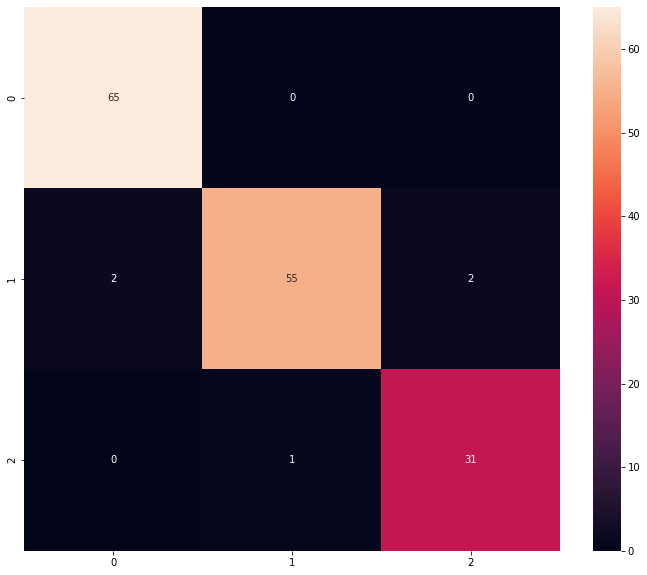

In [ ]:
# Confusion matrix for CNN without callbacks
cm_cnn = confusion_matrix(valY, predY_cnn)
plt.figure(figsize=(12,10))
sns.heatmap(cm_cnn, annot=True, fmt='d')

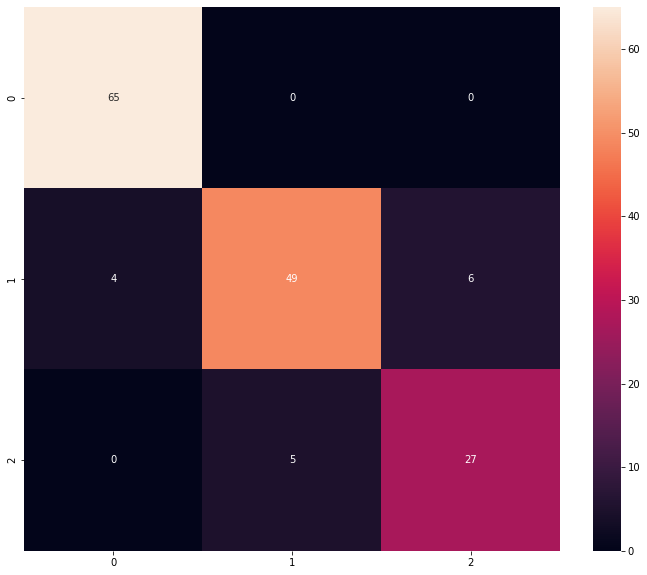

In [ ]:
# Confusion matrix for CNN with callbacks
cm_cnn_cb = confusion_matrix(valY, predY_cnn_cb)
plt.figure(figsize=(12,10))
sns.heatmap(cm_cnn_cb, annot=True, fmt='d')

We can see that model without callback has less misclassifications than model with callbacks as it was trained more at expense of computational time nd overfitting.

### **Classification Report:**

In [ ]:
# Classification Report (CNN Model without callback)
print("Classification Report of CNN without callbacks")
print(classification_report(valY, predY_cnn))

# Classification Report (CNN Model with callback)
print("\nClassification Report of CNN with callbacks")
print(classification_report(valY, predY_cnn_cb))

Classification Report of CNN without callbacks
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        65
           1       0.98      0.93      0.96        59
           2       0.94      0.97      0.95        32

    accuracy                           0.97       156
   macro avg       0.96      0.97      0.97       156
weighted avg       0.97      0.97      0.97       156


Classification Report of CNN with callbacks
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        65
           1       0.91      0.83      0.87        59
           2       0.82      0.84      0.83        32

    accuracy                           0.90       156
   macro avg       0.89      0.89      0.89       156
weighted avg       0.90      0.90      0.90       156



Model without Callbacks performs better. Yet performance of model with callbacks is pretty good for faster computation.

### **Model Accuracy:**

In [ ]:
# Model Accuracy(CNN Model without Callback)
acc_cnn=accuracy_score(valY, predY_cnn)
print("The accuracy of the CNN model without callbacks : {:.2f} % ".format(acc_cnn*100))

# Model Accuracy(CNN Model with Callback)
acc_cnn_cb=accuracy_score(valY, predY_cnn_cb)
print("The accuracy of the CNN model with callbacks : {:.2f} % ".format(acc_cnn_cb*100))

The accuracy of the CNN model without callbacks : 96.79 % 
The accuracy of the CNN model with callbacks : 90.38 % 


CNN Model without callbacks has 6% more accuracy score than the CNN Model with Callbacks.

## **Accuracy and Loss Plots :**

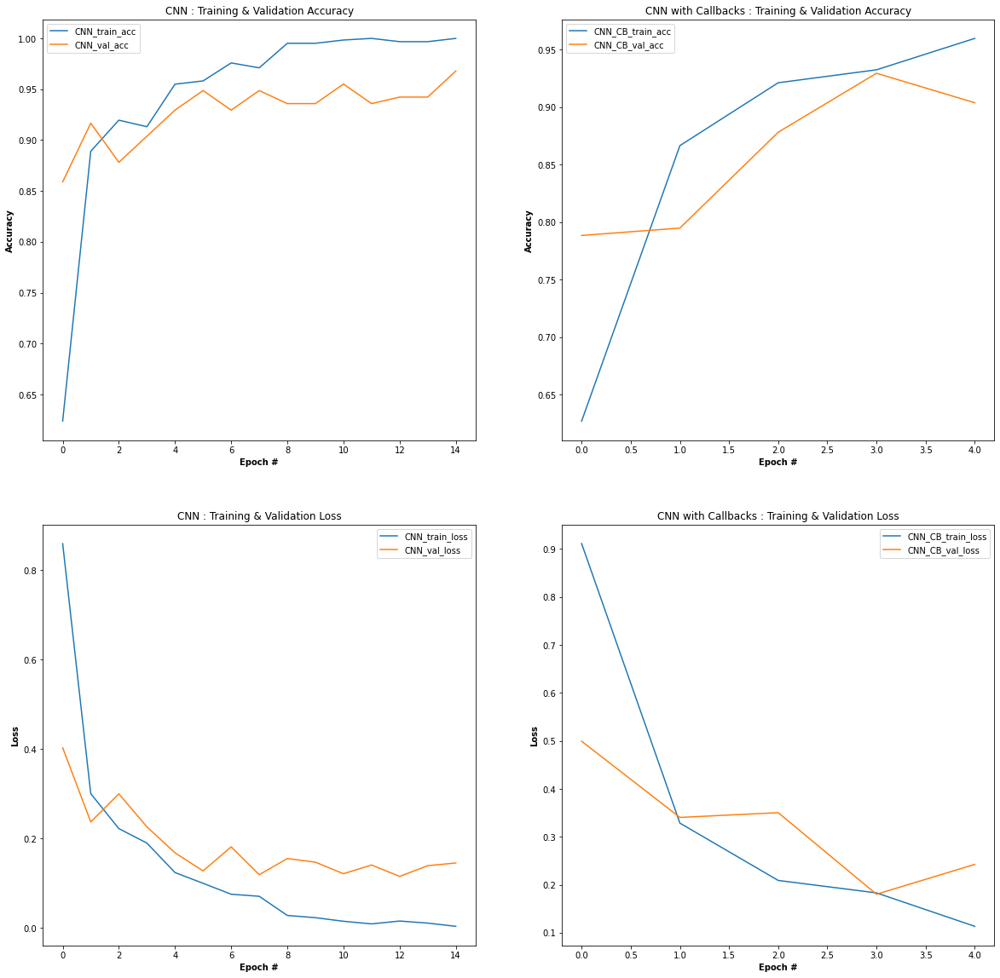

In [ ]:
# Plot the Training and Validation Accuracy and Loss for CNN & CNN_CB
N = np.arange(0,EPOCHS)
N_cb = np.arange(0, 5) # as stopped after 5 Epochs

fig, ax = plt.subplots(2,2, figsize = [20,20])
ax = ax.ravel()

ax[0].plot(N, h.history["accuracy"], label = "CNN_train_acc")
ax[0].plot(N, h.history["val_accuracy"], label = "CNN_val_acc")
ax[0].set_title("CNN : Training & Validation Accuracy")
ax[0].set_xlabel("Epoch #", weight = "bold")
ax[0].set_ylabel("Accuracy", weight = "bold")
ax[0].legend()

ax[1].plot(N_cb, h_cb.history["accuracy"], label = "CNN_CB_train_acc")
ax[1].plot(N_cb, h_cb.history["val_accuracy"], label = "CNN_CB_val_acc")
ax[1].set_title("CNN with Callbacks : Training & Validation Accuracy")
ax[1].set_xlabel("Epoch #", weight = "bold")
ax[1].set_ylabel("Accuracy", weight = "bold")
ax[1].legend()

ax[2].plot(N, h.history["loss"], label = "CNN_train_loss")
ax[2].plot(N, h.history["val_loss"], label = "CNN_val_loss")
ax[2].set_title("CNN : Training & Validation Loss")
ax[2].set_xlabel("Epoch #", weight = "bold")
ax[2].set_ylabel("Loss", weight = "bold")
ax[2].legend()

ax[3].plot(N_cb, h_cb.history["loss"], label = "CNN_CB_train_loss")
ax[3].plot(N_cb, h_cb.history["val_loss"], label = "CNN_CB_val_loss")
ax[3].set_title("CNN with Callbacks : Training & Validation Loss")
ax[3].set_xlabel("Epoch #", weight = "bold")
ax[3].set_ylabel("Loss", weight = "bold")
ax[3].legend()

plt.subplots_adjust(wspace=0.2, hspace=0.2)

We can observe that in case of CNN with callbacks, the epochs are only 5 and for CNN without callbacks as epochs increase the gap between training and validation starts increasing. Thus, we can say % number of Epochs was sweet spot to avoid overtraining and overfitting.

### **Save the model:**
As the model with callback was already saved, we will now save model without callbacks.

In [ ]:
# # Save the model to disk as h5
print("[WIP] Saving the CNN model...")
model_cnn.save('CNNwithoutCB.h5') # Name of the model
print("Model Saved Successfully")

[WIP] Saving the CNN model...
Model Saved Successfully


## **Test Images Prediction :**

In [ ]:
# import required packages
from tensorflow.keras.models import load_model
import pickle
import  cv2
import imutils
import matplotlib.pyplot as plt
%matplotlib inline


In [ ]:
# Function to display images

def display_img(img):
    fig =plt.figure(figsize=(12,10))
    plt.grid(b=None)
    ax = fig.add_subplot(111)
    ax.imshow(img)

**Which model to choose for predictions?**
<br>If accuracy matters more than generalisation, we can go for CNN model without callback. But if for unseen images on which model was not trained a generalised model is better preferred.
<br>Thus we will go with Model with callbacks.

  0%|          | 0/89 [00:00<?, ?it/s]

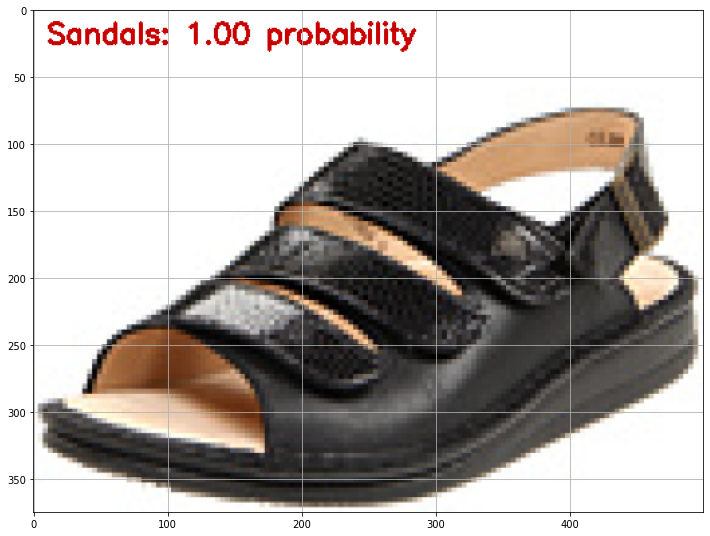

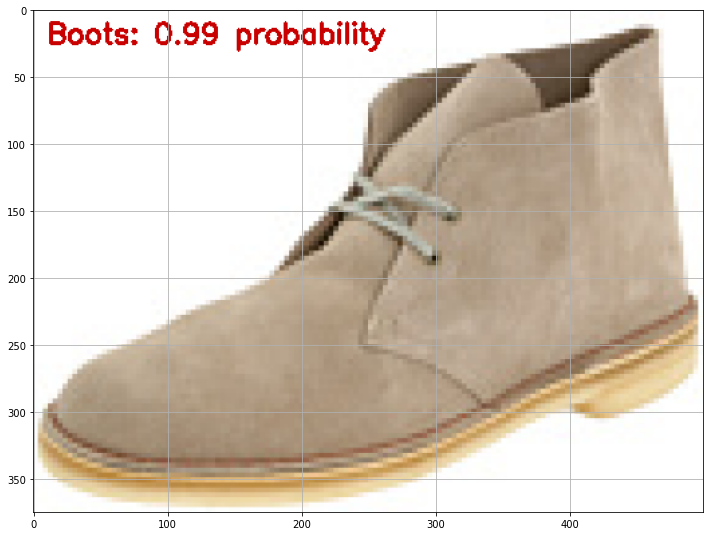

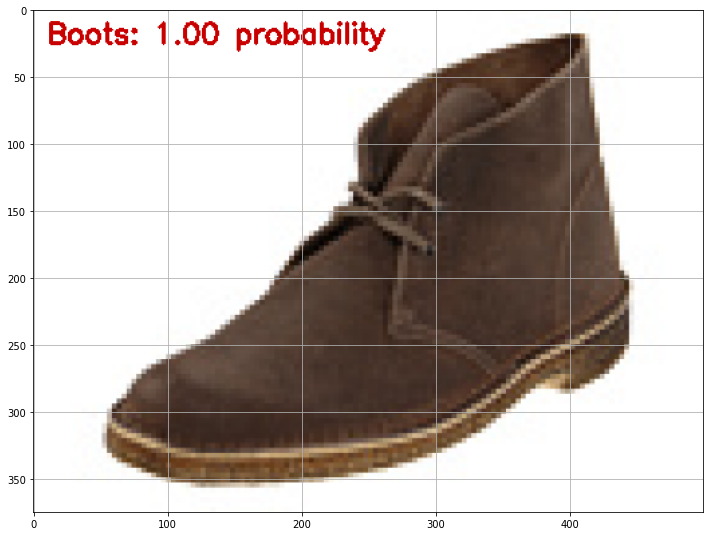

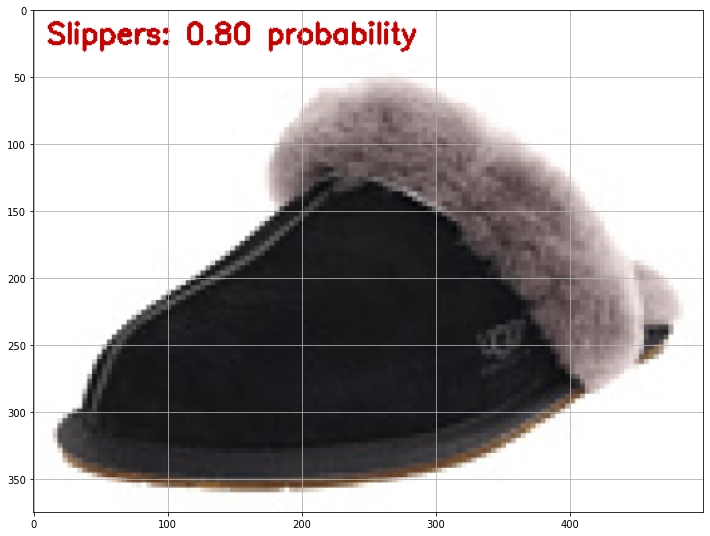

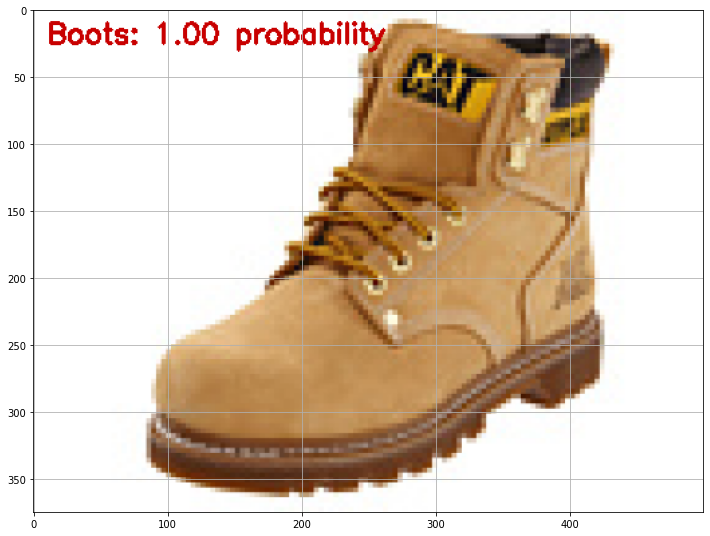

...

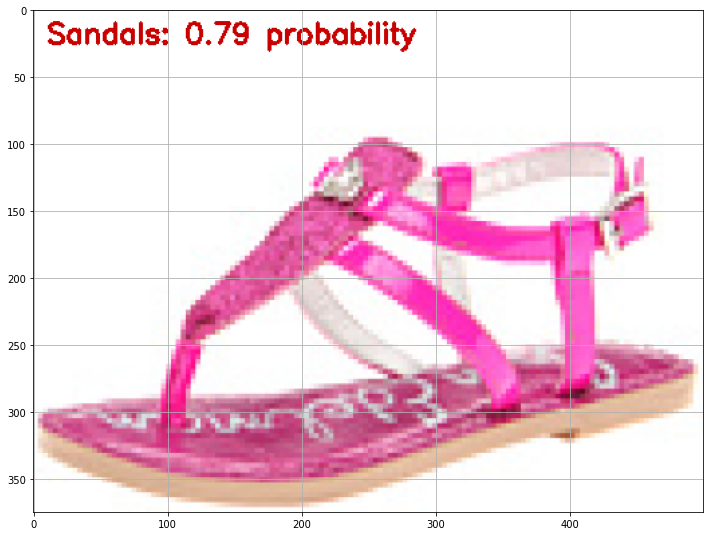

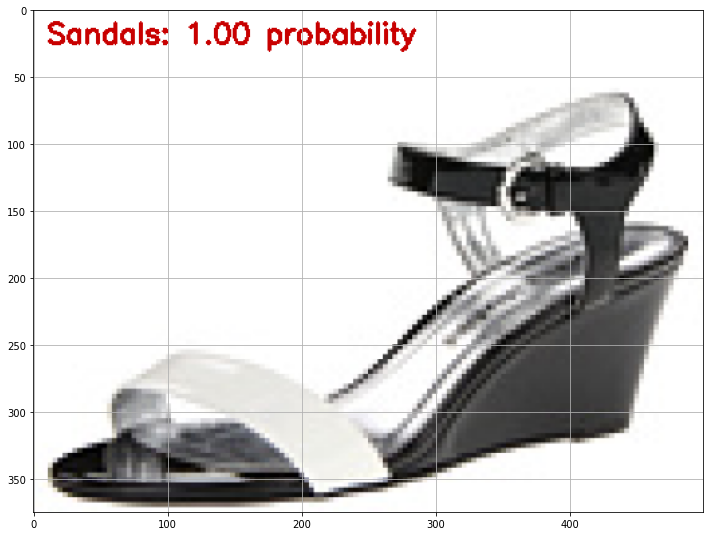

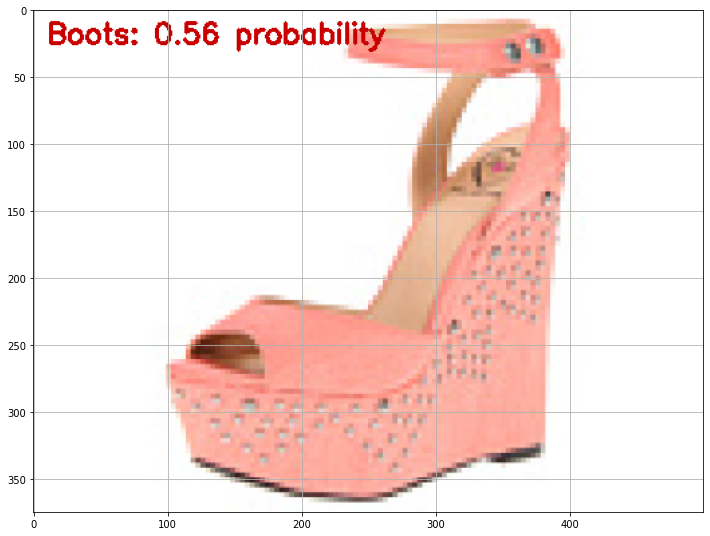

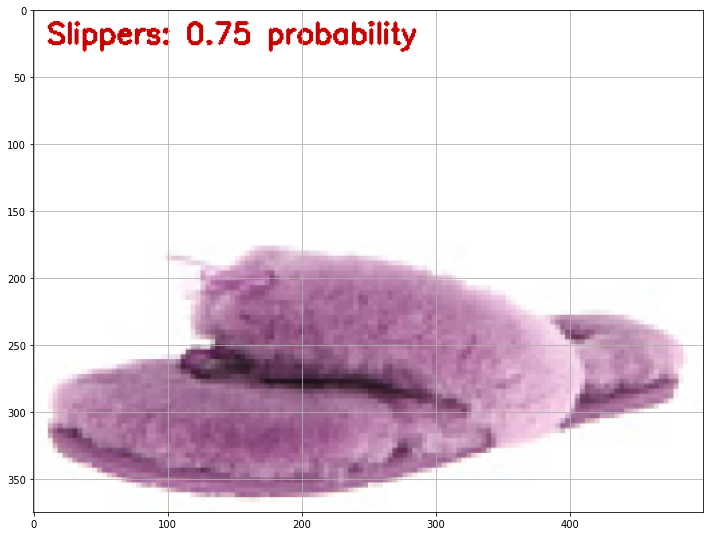

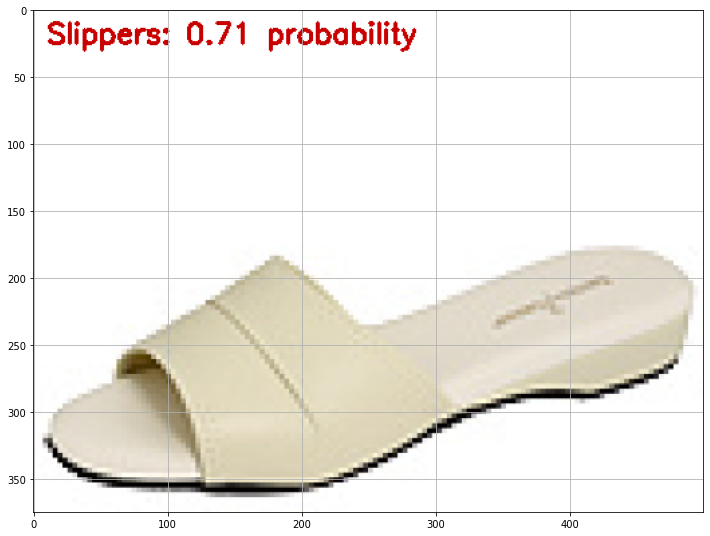

In [ ]:
# Load the input image and resize it to required dimensions

width = 64
height = 64

# Grab the image path
testImagePaths = sorted(list(paths.list_images('ShoeData/test')))  # Folder containing test images

# Progress Bar

with tqdm(total=len(testImagePaths)) as pbar:

    for imagePath in testImagePaths:
        image = cv2.imread(imagePath)
        output = image.copy()
        image = cv2.resize(image, (width, height))

        # Scale pixel values from range 0-255 to range 0-1
        image = image.astype("float") / 255.0

        # As input for the network 
        # image = image.flatten()  # No flatten for CNN Model
        image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))

        # make prediction on the image
        preds_proba =  model_cnn_cb.predict(image)

        # Get the class label cooresponding to index of highest probability
        i = preds_proba.argmax(axis=1)[0]
        img_la = classes[i]

        img_label = "{}: {:.2f} probability".format(img_la, preds_proba[0][i])

        output = imutils.resize(output, width = 500)
        cv2.putText(output, img_label, (10,25), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,200), 2)

        # Convert the image to rgb formatand display
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)

        # Save the classified image in proper folder.
        # we have created three empty folders Boots, Sandals, Slippers
        # get image name
        imgname = imagePath.split(os.path.sep)[-1]
        cv2.imwrite('ShoeData/Classified/{}/{}'.format(img_la,imgname), output)

        pbar.update(1)

Thus, we have classified test images as into different categories into different folders. You can have a look at drive folder.
<br>
<a href = "https://drive.google.com/drive/folders/1uCcAlz4vUB65i60bKSOe7MERqEtLdOyn?usp=sharing"> Visit Drive Folder </a>
<br>
---------------------------------------------------------------------------------**Our Product is built**------------------------------------------------------------------------------------

## **Deploy The Model**

In [ ]:
!pip install gradio

In [ ]:
# Import Gradio
import gradio as gr

## We can also import saved model if not active
# from tensorflow.keras.models import load_model
# # Loading model
# print("[WIP] Loading the model...")
# model_ccn_live = load_model('/content/drive/MyDrive/DeepLearningExamPaper1/my_best_model.hdf5')

In [ ]:
def predict_image(image):

    image = cv2.resize(image, (64,64))

    # scale values from range 0-255 to 0-1
    image = image.astype("float") / 255.0

    # Ready the image for input to the network
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)

    # make prediction on the image
    preds = model_cnn_cb.predict(image)[0]
    result = dict()
    result[classes[0]] = round(float(list(preds)[0]), 3)
    result[classes[1]] = round(float(list(preds)[1]), 3)
    result[classes[2]] = round(float(list(preds)[2]), 3)
    

    return result

In [ ]:
im = gr.inputs.Image(shape= (64,64))
label = gr.outputs.Label(num_top_classes=3)

gr.Interface(fn = predict_image, inputs = im, outputs = label, capture_session=True, title = "CNN Classification of Shoes").launch(share=True)

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://33640.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


(<fastapi.applications.FastAPI at 0x7faa316ab610>,
 'http://127.0.0.1:7860/',
 'https://33640.gradio.app')

# THANK YOU